In [1]:
from bertopic import BERTopic
from top2vec import Top2Vec
from sklearn.datasets import fetch_20newsgroups
from unicodedata import normalize
from tqdm import tqdm
from glob import glob
import spacy
from unidecode import unidecode

In [2]:
with open(r'data/Tolstoi - La mort de Ivan Ilitch.txt', 'r', encoding='utf-8') as file:
    ivan_illitch = file.readlines()

In [3]:
str_base = " "
ivan_illitch_str = str_base.join(ivan_illitch)

In [4]:
def clean_text(txt):
    txt_res = normalize("NFKD", str(txt).replace(u'\xa0', u' '))
    txt_res = txt_res.replace(u'\\xa0', u' ')
    txt_res = txt_res.replace(u'\\n', u'')
    txt_res = txt_res.replace(u'\n', u'')
    txt_res = txt_res.replace(u'\\', u'')
    txt_res = txt_res.replace(u'\'', u'')

    return txt_res

In [5]:
ivan_illitch_cleaned = clean_text(ivan_illitch_str)

In [6]:
len(ivan_illitch_cleaned)

133515

In [7]:
nlp = spacy.load('fr_core_news_lg')

In [8]:
stopwords = nlp.Defaults.stop_words

In [9]:
docs = nlp(ivan_illitch_cleaned)

In [10]:
len(docs)

25887

In [11]:
def lemmatized_ivan(docs, sw):
    pos_ko = ["NUM", "X", "SYM", "PUNCT", "SPACE"]
    list_lemma = []
    list_token = []
    for token in docs:
        list_token.append(token.text)
        if token.text not in sw and token.pos_ not in pos_ko:
            list_lemma.append(token.lemma_)    
    return list_token, list_lemma

In [12]:
list_token, list_lemma = lemmatized_ivan(docs, stopwords)

In [13]:
def chunkise(list_token, n):
    str_base = " "
    list_chunks = []
    for i in range(0, len(list_token)-n, n):
        list_chunks.append(str_base.join(list_token[i:i+n]))
    return list_chunks

In [14]:
list_chunks_token = chunkise(list_token, 50)

In [15]:
list_chunks_lemma = chunkise(list_lemma, 50)

### BERT TOPIC

In [16]:
topic_model = BERTopic(language="multilingual")

In [17]:
topics, probs = topic_model.fit_transform(list_chunks_token)

In [18]:
topic_model.get_topic_info()

,Topic,Count,Name
0,-1,152,-1_de_il_et_le
1,0,114,0_il_de_la_et
2,1,69,1_le_de_me_et
3,2,51,2_ivanovitch_piotr_de_le
4,3,30,3_elle_de_me_se
5,4,29,4_de_service_et_ivan
6,5,27,5_ilitch_de_ivan_et
7,6,19,6_rassime_gue_pieds_ivan
8,7,14,7_de_la_femme_plus
9,8,12,8_de_des_et_avec


In [19]:
topic_model.get_topic(1)

[('le', 0.05292926489761196),
 ('de', 0.0495462891806963),
 ('me', 0.04928219145805419),
 ('et', 0.04679512907360228),
 ('docteur', 0.04300729646115874),
 ('ilitch', 0.04006814848142242),
 ('ivan', 0.03722578853315457),
 ('que', 0.035024634384329574),
 ('lui', 0.03313536762465296),
 ('ce', 0.03313536762465296)]

In [20]:
topic_model.visualize_topics()

In [21]:
topic_model.visualize_barchart()

In [22]:
topics, probs = topic_model.fit_transform(list_chunks_lemma)

In [23]:
topic_model.get_topic_info()

,Topic,Count,Name
0,0,62,0_ivanovitch_ilitch_piotr_ivan
1,1,61,1_il_me_de_re
2,2,47,2_ilitch_ivan_re_me
3,-1,43,-1_me_re_il_de
4,3,31,3_me_docteur_ce_decin


In [24]:
topic_model.visualize_barchart()

### TOP2VEC

In [29]:
model_tokens = Top2Vec(documents=list_chunks_token, min_count=5, embedding_model='universal-sentence-encoder')

2022-05-22 18:36:02,711 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2022-05-22 18:36:02,800 - top2vec - INFO - Downloading universal-sentence-encoder model
INFO:top2vec:Downloading universal-sentence-encoder model
2022-05-22 18:36:08,785 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2022-05-22 18:36:09,265 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2022-05-22 18:36:11,748 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2022-05-22 18:36:11,766 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [30]:
model.get_num_topics()

4

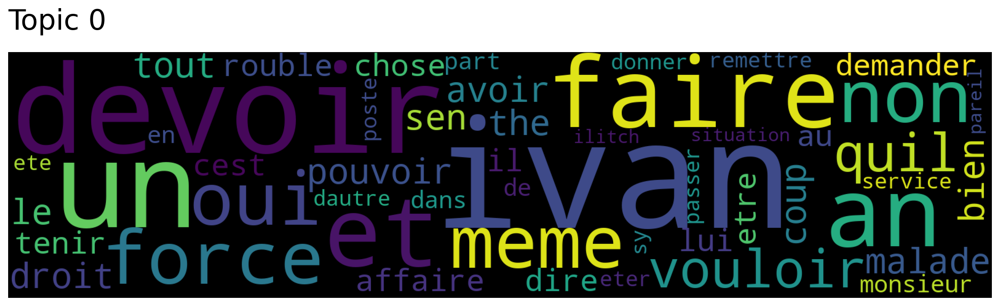

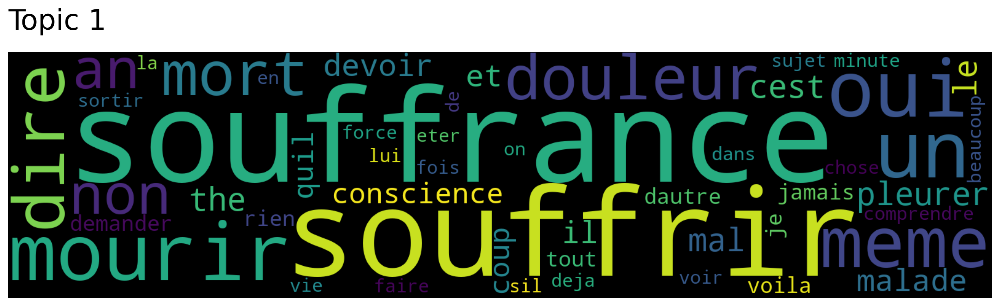

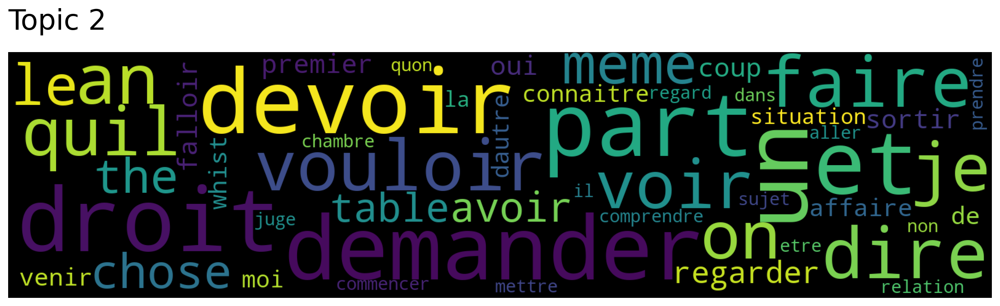

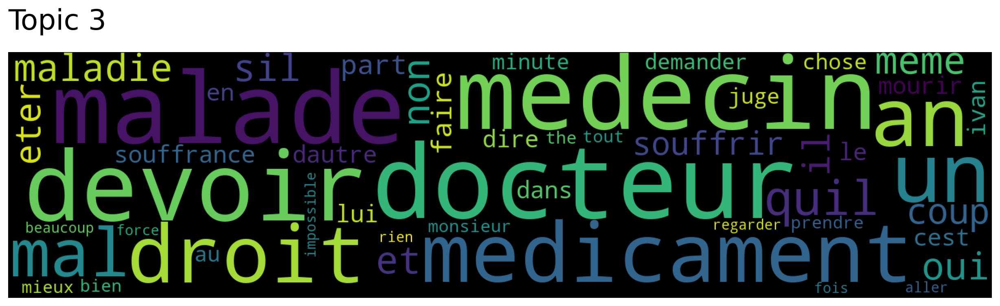

In [31]:
topic_sizes, topic_nums = model.get_topic_sizes()
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

In [27]:
model_lemma = Top2Vec(documents=list_chunks_lemma, min_count=5, embedding_model='universal-sentence-encoder')

2022-05-22 18:35:01,333 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2022-05-22 18:35:01,403 - top2vec - INFO - Downloading universal-sentence-encoder model
INFO:top2vec:Downloading universal-sentence-encoder model
2022-05-22 18:35:06,872 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2022-05-22 18:35:07,287 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2022-05-22 18:35:09,435 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2022-05-22 18:35:09,450 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


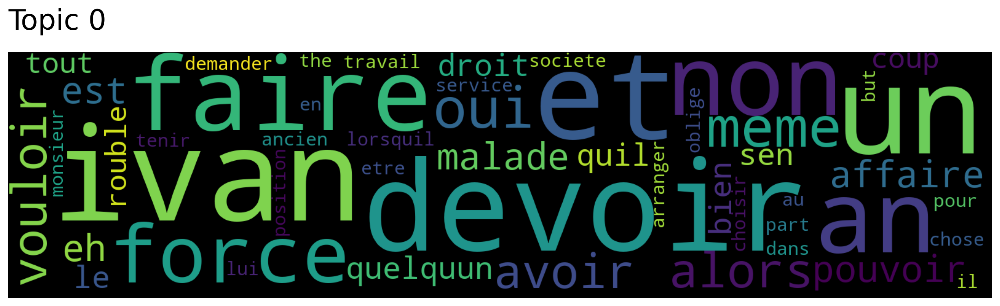

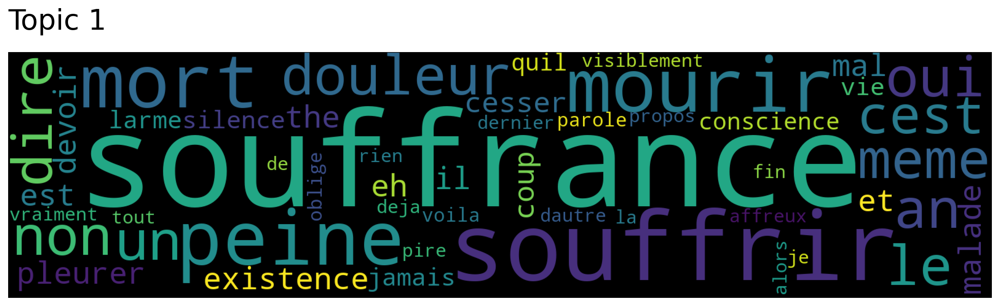

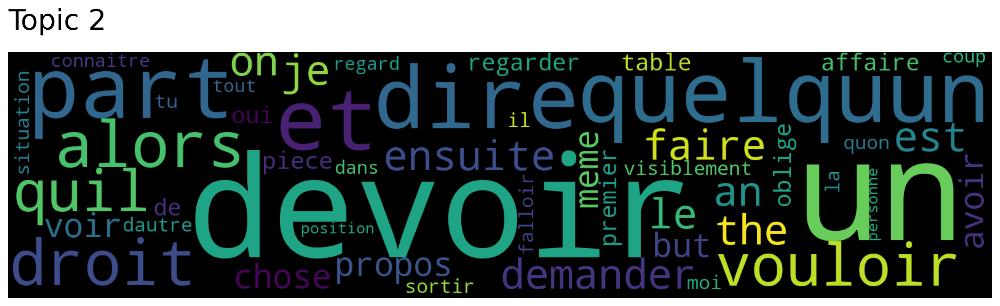

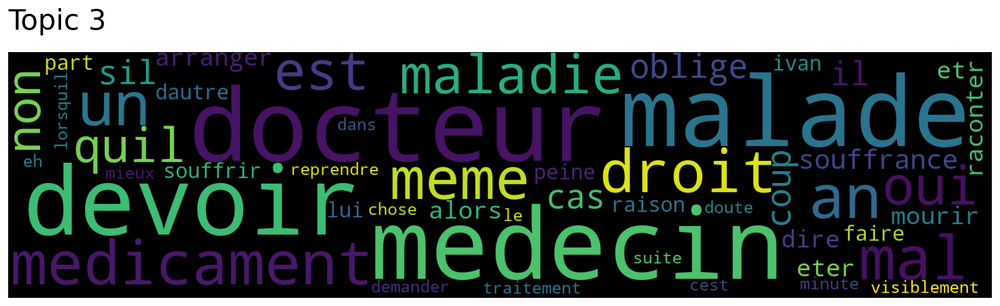

In [28]:
topic_sizes, topic_nums = model_lemma.get_topic_sizes()
for topic in topic_nums:
    model_lemma.generate_topic_wordcloud(topic)

In [52]:
model_test = Top2Vec(documents=list_chunks_lemma, min_count=1, embedding_model='universal-sentence-encoder')

2022-05-22 18:43:45,742 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2022-05-22 18:43:45,823 - top2vec - INFO - Downloading universal-sentence-encoder model
INFO:top2vec:Downloading universal-sentence-encoder model
2022-05-22 18:43:53,463 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2022-05-22 18:43:54,382 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2022-05-22 18:43:56,711 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2022-05-22 18:43:56,751 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [53]:
model_test.get_num_topics()

4

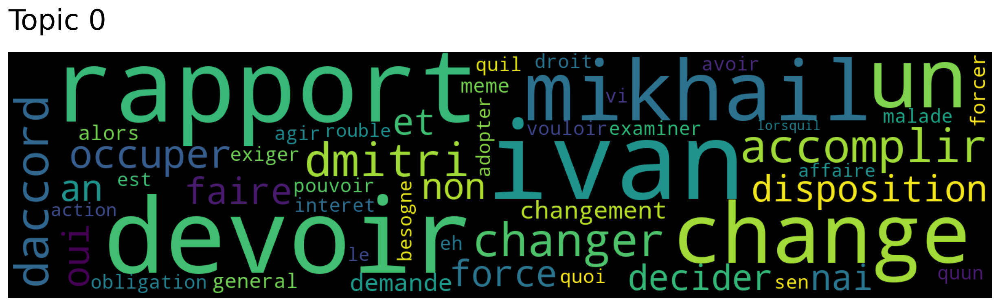

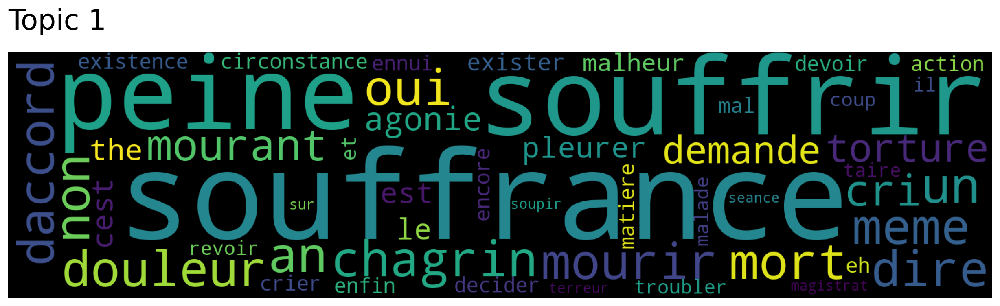

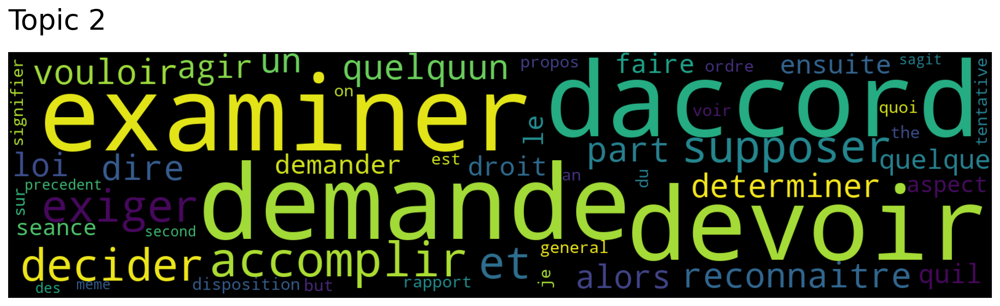

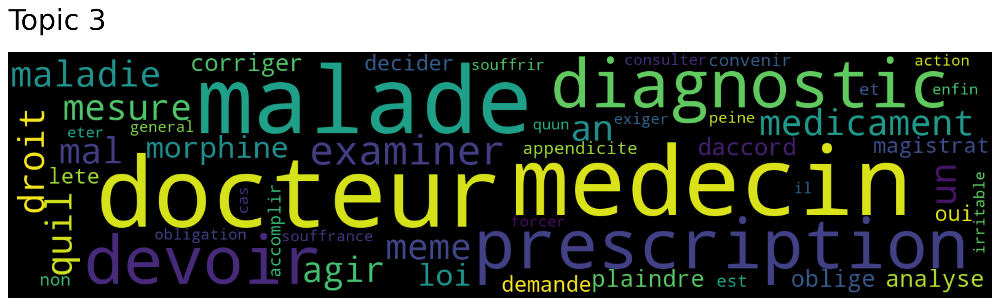

In [54]:
topic_sizes, topic_nums = model_test.get_topic_sizes()
for topic in topic_nums:
    model_test.generate_topic_wordcloud(topic)